In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
%matplotlib inline
from fbprophet import Prophet

import seaborn as sns

import plotly
import chart_studio.plotly as py
#import cufflinks as cf
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()

import warnings
warnings.filterwarnings("ignore")

C:\Users\Hitesh\AppData\Local\Continuum\anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
import pandas as pd
import glob

path = r'C:/Users/Hitesh/Desktop/LJMU/Forex Implementation/USD AUD/Data/' 
all_files = glob.glob(path + "/*.csv")

li = []

for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0)
    df.columns = ['Index','ds','Open_Bid_Quote','High_Bid_Quote','Low_Bid_Quote','y','Volume']
    df.drop(columns=['Index','Volume','Open_Bid_Quote','High_Bid_Quote','Low_Bid_Quote'],inplace=True)
    li.append(df)

data = pd.concat(li, axis=0, ignore_index=True)

In [3]:
data.head()

,ds,y
0,2010-01-03 17:01:00,0.8982
1,2010-01-03 17:03:00,0.8984
2,2010-01-03 17:06:00,0.8985
3,2010-01-03 17:07:00,0.8986
4,2010-01-03 17:08:00,0.8986


In [4]:
from datetime import datetime                                              
data['ds'] = pd.to_datetime(data['ds'])
#data = data.set_index('ds')

In [5]:
data = data.resample('H', on='ds').max()
data = data.rename_axis("Index")
data.head()

,ds,y
Index,,
2010-01-03 17:00:00,2010-01-03 17:59:00,0.8996
2010-01-03 18:00:00,2010-01-03 18:59:00,0.8995
2010-01-03 19:00:00,2010-01-03 19:59:00,0.8982
2010-01-03 20:00:00,2010-01-03 20:59:00,0.8962
2010-01-03 21:00:00,2010-01-03 21:59:00,0.8966


In [6]:
data=data.dropna(subset=['ds', 'y'])

In [7]:
data['y'].isnull().sum()/len(data)*100

0.0

In [8]:
print(len(data))
print(int(len(data)*20/100))

71470
14294


In [9]:
# create test dataset, remove last 12 months
train = data.drop(data.index[-(int(len(data)*20/100)):])
print(train.tail())

                                     ds        y
Index                                           
2019-03-13 07:00:00 2019-03-13 07:59:00  0.70655
2019-03-13 08:00:00 2019-03-13 08:59:00  0.70731
2019-03-13 09:00:00 2019-03-13 09:59:00  0.70720
2019-03-13 10:00:00 2019-03-13 10:59:00  0.70877
2019-03-13 11:00:00 2019-03-13 11:59:00  0.70871


In [10]:
# create test dataset, remove last 12 months
test = data.drop(data.index[:-(int(len(data)*20/100))])
print(test.tail())

                                     ds        y
Index                                           
2021-06-30 19:00:00 2021-06-30 19:59:00  0.75005
2021-06-30 20:00:00 2021-06-30 20:59:00  0.74944
2021-06-30 21:00:00 2021-06-30 21:59:00  0.74893
2021-06-30 22:00:00 2021-06-30 22:59:00  0.74913
2021-06-30 23:00:00 2021-06-30 23:58:00  0.74918


In [11]:
print(len(train))
print(len(test))

57176
14294


In [12]:
print(train['ds'].max())
print(train['ds'].min())
print(test['ds'].max())
print(test['ds'].min())

2019-03-13 11:59:00
2010-01-03 17:59:00
2021-06-30 23:58:00
2019-03-13 12:59:00


In [13]:
# define the model
model = Prophet()
# fit the model
model.fit(train)

In [14]:
model

In [15]:
future=pd.date_range(test['ds'].min(),test['ds'].max(),freq='min')
len(future)

1210260

In [16]:
future

DatetimeIndex(['2019-03-13 12:59:00', '2019-03-13 13:00:00',
               '2019-03-13 13:01:00', '2019-03-13 13:02:00',
               '2019-03-13 13:03:00', '2019-03-13 13:04:00',
               '2019-03-13 13:05:00', '2019-03-13 13:06:00',
               '2019-03-13 13:07:00', '2019-03-13 13:08:00',
               ...
               '2021-06-30 23:49:00', '2021-06-30 23:50:00',
               '2021-06-30 23:51:00', '2021-06-30 23:52:00',
               '2021-06-30 23:53:00', '2021-06-30 23:54:00',
               '2021-06-30 23:55:00', '2021-06-30 23:56:00',
               '2021-06-30 23:57:00', '2021-06-30 23:58:00'],
              dtype='datetime64[ns]', length=1210260, freq='T')

In [17]:
from pandas import DataFrame
future = DataFrame(future)
future.columns = ['ds']
future.head()

,ds
0,2019-03-13 12:59:00
1,2019-03-13 13:00:00
2,2019-03-13 13:01:00
3,2019-03-13 13:02:00
4,2019-03-13 13:03:00


In [18]:
future = pd.merge(test, future, on=['ds'], how='inner')
future.head()

,ds,y
0,2019-03-13 12:59:00,0.70828
1,2019-03-13 13:59:00,0.70913
2,2019-03-13 14:59:00,0.70967
3,2019-03-13 15:59:00,0.70972
4,2019-03-13 16:59:00,0.70940


In [19]:
len(future)

14294

In [20]:
print(future['ds'].min())
print(future['ds'].max())

2019-03-13 12:59:00
2021-06-30 23:58:00


In [21]:
future['ds'] = pd.to_datetime(future['ds'])
len(future)

14294

In [22]:
# use the model to make a forecast
forecast = model.predict(future)

In [23]:
# calculate MAE between expected and predicted values for december
y_true = test['y'][-(len(future)):].values
y_pred = forecast['yhat'].values

In [24]:
y_true

array([0.70828, 0.70913, 0.70967, ..., 0.74893, 0.74913, 0.74918])

In [25]:
y_pred

array([0.72065439, 0.72063193, 0.72065216, ..., 0.61150242, 0.61139887,
       0.61126793])

In [26]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, classification_report, explained_variance_score
from sklearn import metrics
from math import sqrt

In [27]:
mae = mean_absolute_error(y_true, y_pred)
print('MAE: %.3f' % mae)

MAE: 0.056


In [28]:
from sklearn.metrics import mean_squared_error

rms = sqrt(mean_squared_error(y_true, y_pred))
rms

0.07641180991258872

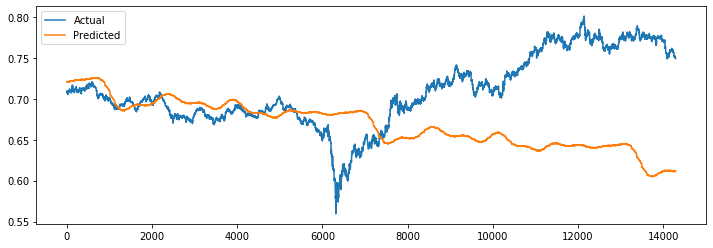

In [29]:
# plot expected vs actual
plt.figure(figsize=(12,4))
plt.plot(y_true, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.legend()
plt.show()

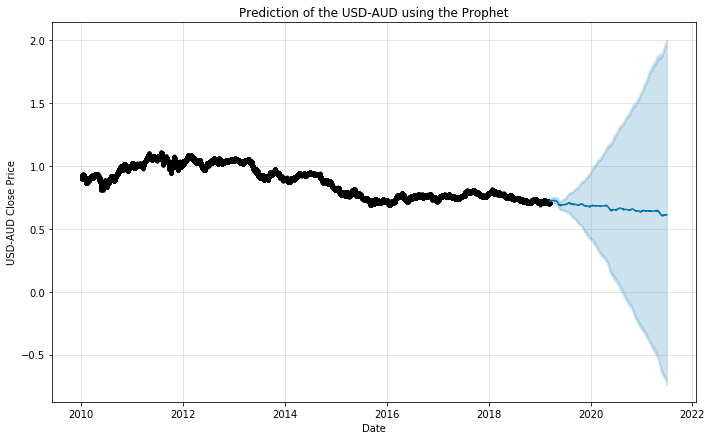

In [30]:
model.plot(forecast)
plt.title("Prediction of the USD-AUD using the Prophet")
plt.xlabel("Date")
plt.ylabel("USD-AUD Close Price")
plt.show()

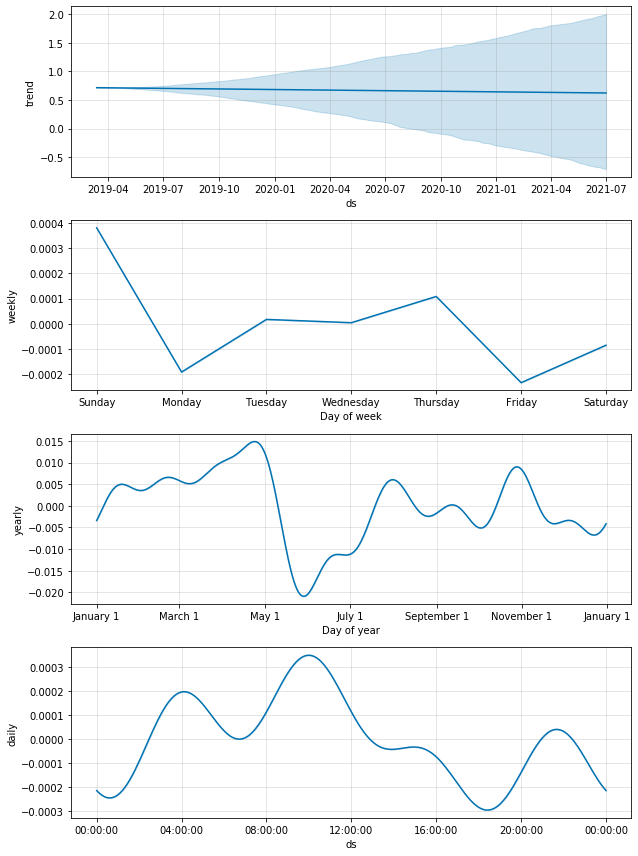

In [31]:
model.plot_components(forecast)
plt.show()

In [32]:
trace_open = go.Scatter(
    x = forecast["ds"],
    y = forecast["yhat"],
    mode = 'lines',
    name="Forecast"
)

trace_high = go.Scatter(
    x = forecast["ds"],
    y = forecast["yhat_upper"],
    mode = 'lines',
    fill = "tonexty", 
    line = {"color": "#57b8ff"}, 
    name="Higher uncertainty interval"
)

trace_low = go.Scatter(
    x = forecast["ds"],
    y = forecast["yhat_lower"],
    mode = 'lines',
    fill = "tonexty", 
    line = {"color": "#57b8ff"}, 
    name="Lower uncertainty interval"
)

trace_close = go.Scatter(
    x = data["ds"],
    y = data["y"],
    name="Data values"
)



data = [trace_open,trace_high,trace_low,trace_close]

layout = go.Layout(title="USD-AUD Forecast",xaxis_rangeslider_visible=True)

fig = go.Figure(data=data,layout=layout)

plotly.offline.iplot(fig)

In [33]:
test[test.index.min():].head()

,ds,y
Index,,
2019-03-13 12:00:00,2019-03-13 12:59:00,0.70828
2019-03-13 13:00:00,2019-03-13 13:59:00,0.70913
2019-03-13 14:00:00,2019-03-13 14:59:00,0.70967
2019-03-13 15:00:00,2019-03-13 15:59:00,0.70972
2019-03-13 16:00:00,2019-03-13 16:59:00,0.70940


In [34]:
forecast['yhat'].head()

0    0.720654
1    0.720632
2    0.720652
3    0.720623
4    0.720524
Name: yhat, dtype: float64

In [35]:
forecast.columns

Index(['ds', 'trend', 'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper',
       'additive_terms', 'additive_terms_lower', 'additive_terms_upper',
       'daily', 'daily_lower', 'daily_upper', 'weekly', 'weekly_lower',
       'weekly_upper', 'yearly', 'yearly_lower', 'yearly_upper',
       'multiplicative_terms', 'multiplicative_terms_lower',
       'multiplicative_terms_upper', 'yhat'],
      dtype='object')

In [36]:
forecast['ds'].head()

0   2019-03-13 12:59:00
1   2019-03-13 13:59:00
2   2019-03-13 14:59:00
3   2019-03-13 15:59:00
4   2019-03-13 16:59:00
Name: ds, dtype: datetime64[ns]

In [37]:
forecast['ds'] = pd.to_datetime(forecast['ds'])

In [38]:
forecast = forecast.set_index('ds')
forecast.head()

,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
ds,,,,,,,,,,,,,,,,,,,,,
2019-03-13 12:59:00,0.715127,0.700076,0.740945,0.715127,0.715127,0.005527,0.005527,0.005527,-0.000009,-0.000009,...,0.000031,0.000031,0.000031,0.005506,0.005506,0.005506,0.0,0.0,0.0,0.720654
2019-03-13 13:59:00,0.715123,0.699423,0.741309,0.715123,0.715123,0.005509,0.005509,0.005509,-0.000042,-0.000042,...,0.000039,0.000039,0.000039,0.005513,0.005513,0.005513,0.0,0.0,0.0,0.720632
2019-03-13 14:59:00,0.715118,0.699634,0.742368,0.715118,0.715118,0.005534,0.005534,0.005534,-0.000032,-0.000032,...,0.000047,0.000047,0.000047,0.005520,0.005520,0.005520,0.0,0.0,0.0,0.720652
2019-03-13 15:59:00,0.715114,0.699781,0.741373,0.715114,0.715114,0.005510,0.005510,0.005510,-0.000072,-0.000072,...,0.000055,0.000055,0.000055,0.005527,0.005527,0.005527,0.0,0.0,0.0,0.720623
2019-03-13 16:59:00,0.715109,0.699288,0.740902,0.715109,0.715109,0.005415,0.005415,0.005415,-0.000182,-0.000182,...,0.000063,0.000063,0.000063,0.005534,0.005534,0.005534,0.0,0.0,0.0,0.720524


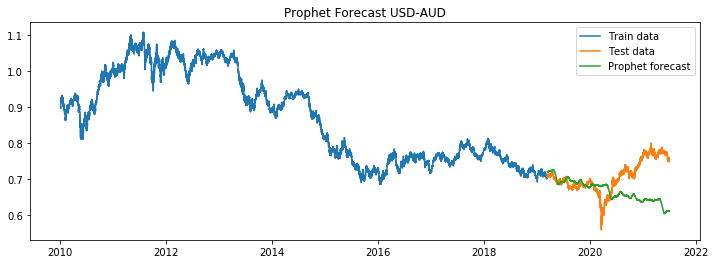

In [39]:
plt.figure(figsize=(12,4))
plt.plot(train['y'], label='Train data')
plt.plot(test['y'], label='Test data')
plt.plot(forecast['yhat'][test.index.min():], label='Prophet forecast')
plt.legend(loc='best')
plt.title('Prophet Forecast USD-AUD')
plt.show()